In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

In [2]:
df_corgi = pd.read_csv('vehicle.csv')
df_corgi.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [3]:
df_corgi.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

In [4]:
df_corgi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
compactness                    846 non-null int64
circularity                    841 non-null float64
distance_circularity           842 non-null float64
radius_ratio                   840 non-null float64
pr.axis_aspect_ratio           844 non-null float64
max.length_aspect_ratio        846 non-null int64
scatter_ratio                  845 non-null float64
elongatedness                  845 non-null float64
pr.axis_rectangularity         843 non-null float64
max.length_rectangularity      846 non-null int64
scaled_variance                843 non-null float64
scaled_variance.1              844 non-null float64
scaled_radius_of_gyration      844 non-null float64
scaled_radius_of_gyration.1    842 non-null float64
skewness_about                 840 non-null float64
skewness_about.1               845 non-null float64
skewness_about.2               845 non-null float64
hollows_ratio    

In [5]:
df_corgi.shape

(846, 19)

In [6]:
df_corgi.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,846.000000,841.000000,842.000000,840.000000,844.000000,846.000000,845.000000,845.000000,843.000000,846.000000,843.000000,844.000000,844.000000,842.000000,840.000000,845.000000,845.000000,846.000000
mean,93.678487,44.828775,82.110451,168.888095,61.678910,8.567376,168.901775,40.933728,20.582444,147.998818,188.631079,439.494076,174.709716,72.447743,6.364286,12.602367,188.919527,195.632388
std,8.234474,6.152172,15.778292,33.520198,7.891463,4.601217,33.214848,7.816186,2.592933,14.515652,31.411004,176.666903,32.584808,7.486190,4.920649,8.936081,6.155809,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.000000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


# Handling Null Values

In [7]:
for i in df_corgi:
    print('Column Name: ', i)
    print('The number of null values in the column is: ', len(df_corgi[i][df_corgi[i].isna() == True]))
    print(df_corgi[i][df_corgi[i].isna() == True])
    print('\n')

Column Name:  compactness
The number of null values in the column is:  0
Series([], Name: compactness, dtype: int64)


Column Name:  circularity
The number of null values in the column is:  5
5     NaN
105   NaN
118   NaN
266   NaN
396   NaN
Name: circularity, dtype: float64


Column Name:  distance_circularity
The number of null values in the column is:  4
35    NaN
118   NaN
207   NaN
319   NaN
Name: distance_circularity, dtype: float64


Column Name:  radius_ratio
The number of null values in the column is:  6
9     NaN
78    NaN
159   NaN
287   NaN
345   NaN
467   NaN
Name: radius_ratio, dtype: float64


Column Name:  pr.axis_aspect_ratio
The number of null values in the column is:  2
19    NaN
222   NaN
Name: pr.axis_aspect_ratio, dtype: float64


Column Name:  max.length_aspect_ratio
The number of null values in the column is:  0
Series([], Name: max.length_aspect_ratio, dtype: int64)


Column Name:  scatter_ratio
The number of null values in the column is:  1
249   NaN
Name: sca

Handling Null values - Replacing it with Median values

In [8]:
for i in df_corgi:
    if len(df_corgi[i][df_corgi[i].isna() == True]) > 1:
        print("Column : ",i)
        print("Corrseponding Median values:", df_corgi[i].median())

Column :  circularity
Corrseponding Median values: 44.0
Column :  distance_circularity
Corrseponding Median values: 80.0
Column :  radius_ratio
Corrseponding Median values: 167.0
Column :  pr.axis_aspect_ratio
Corrseponding Median values: 61.0
Column :  pr.axis_rectangularity
Corrseponding Median values: 20.0
Column :  scaled_variance
Corrseponding Median values: 179.0
Column :  scaled_variance.1
Corrseponding Median values: 363.5
Column :  scaled_radius_of_gyration
Corrseponding Median values: 173.5
Column :  scaled_radius_of_gyration.1
Corrseponding Median values: 71.5
Column :  skewness_about
Corrseponding Median values: 6.0


In [9]:
for i in df_corgi:
    if len(df_corgi[i][df_corgi[i].isna() == True]) >= 1:
        df_corgi[i][list(df_corgi[i][df_corgi[i].isna() == True].index)] = df_corgi[i].median()

C:\Users\ADMIN\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


# Correlation Map

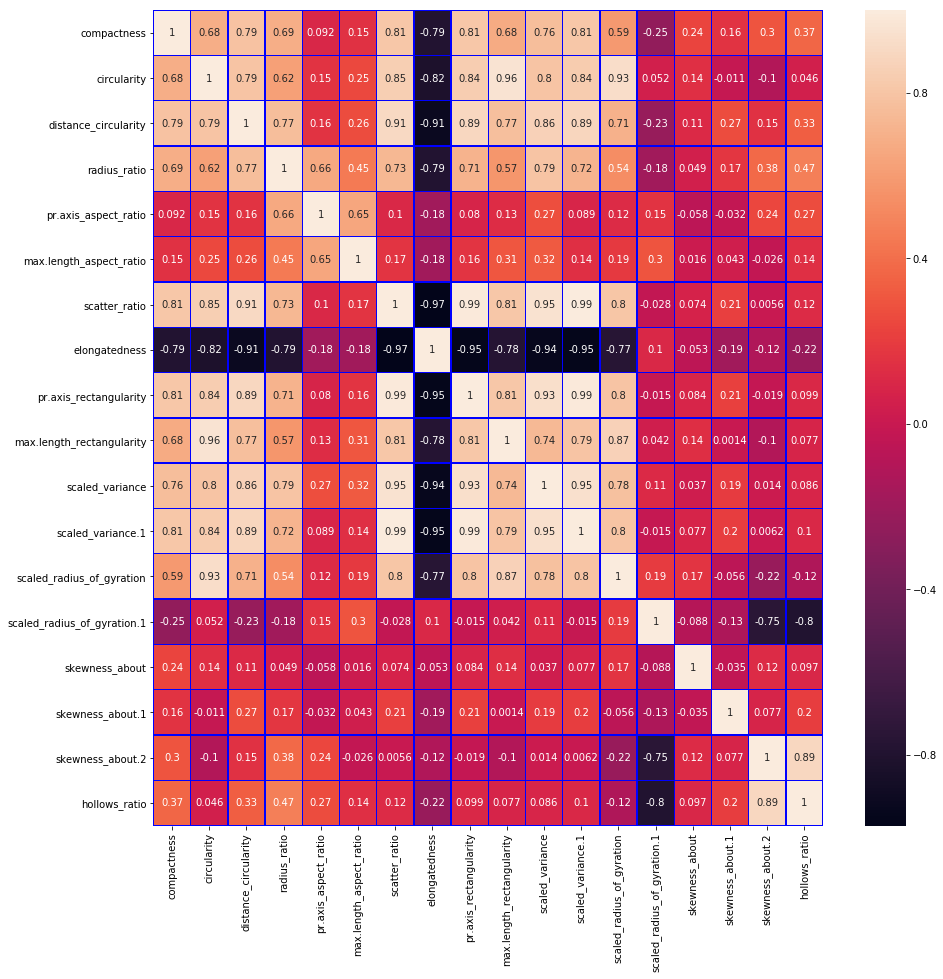

In [10]:
fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(df_corgi.corr(method='pearson'),annot=True,ax=ax,linewidths=0.5,linecolor='blue')
plt.show()

From the above correlation heatmap it is evident that the independet variables are either positively 
or negatively correlated to one another the correlation rage of the dataset is between -0.96 to -0.91 
(excluding the correlation between same attributes -1 to 1). This value shows that the independent attributes are strongly 
related to one another

In [11]:
df_corgi.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

# Box Plots to Identify Outliers

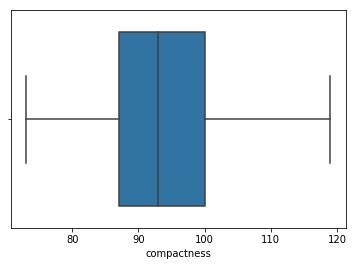

In [12]:
sns.boxplot(df_corgi['compactness'])
plt.show()

The box plot shows there are no outliers in the column compactness

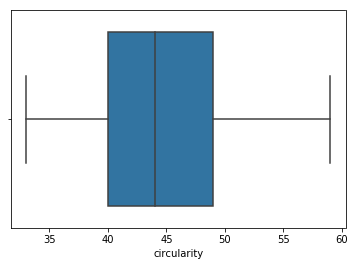

In [13]:
sns.boxplot(df_corgi['circularity'])
plt.show()

The boxplot shows there are no outliers in the column circularity.

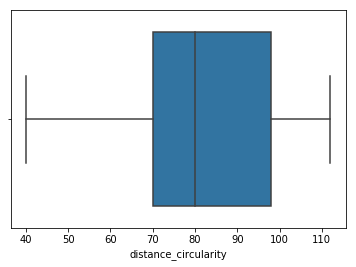

In [14]:
sns.boxplot(df_corgi['distance_circularity'])
plt.show()

The box plot shows that there are no outliers in the attribute distance_circularity.

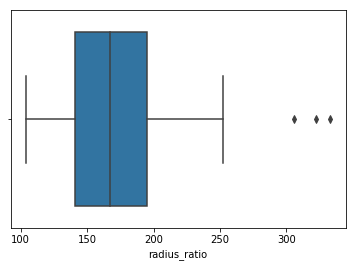

In [15]:
sns.boxplot(df_corgi['radius_ratio'])
plt.show()

The box plot shows there are outliers in the column radius ratio

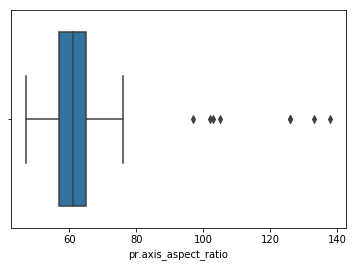

In [16]:
sns.boxplot(df_corgi['pr.axis_aspect_ratio'])
plt.show()

The box plot shows distinct outliers are available in the attribute pr.axis_aspect_ratio

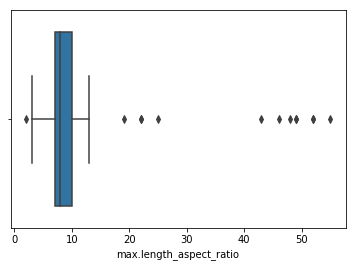

In [17]:
sns.boxplot(df_corgi['max.length_aspect_ratio'])
plt.show()

The box plot shows there are outliers in the column maz.length aspect ratio on either side of the data.

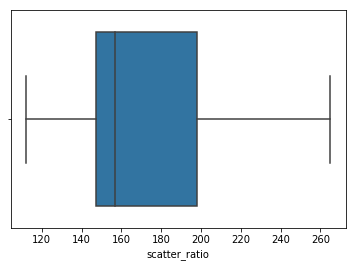

In [18]:
sns.boxplot(df_corgi['scatter_ratio'])
plt.show()

The box plot shows that the attribute scatter ratio does not have any outliers

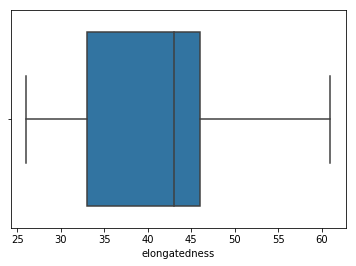

In [19]:
sns.boxplot(df_corgi['elongatedness'])
plt.show()

The box plot shows that the attribute elongatedness does not have any outliers

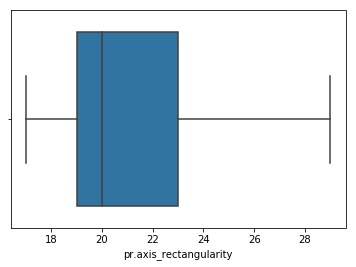

In [20]:
sns.boxplot(df_corgi['pr.axis_rectangularity'])
plt.show()

The box plot shows that the attribute pr.axis_rectangularity does not have any outliers

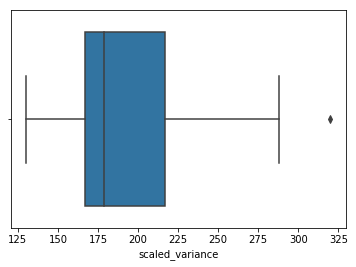

In [21]:
sns.boxplot(df_corgi['scaled_variance'])
plt.show()

The above plot shows that the column scaled variance has outliers.

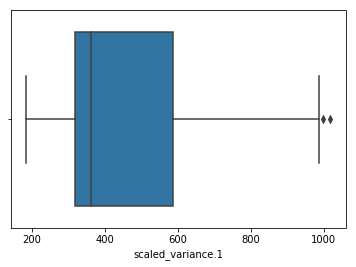

In [22]:
sns.boxplot(df_corgi['scaled_variance.1'])
plt.show()

The above plot shows that the column scaled variance has outliers

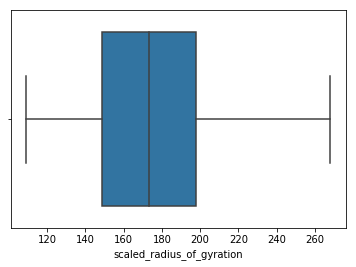

In [23]:
sns.boxplot(df_corgi['scaled_radius_of_gyration'])
plt.show()

The above box plot shows that the column scaled radius of gyration does not have any outliers.

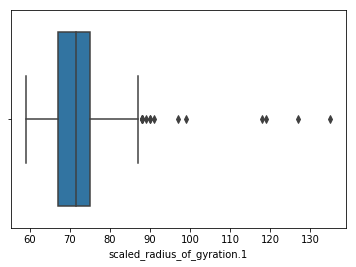

In [24]:
sns.boxplot(df_corgi['scaled_radius_of_gyration.1'])
plt.show()

The above box plot shows that the column scaled radius of gyration 1 has outliers.

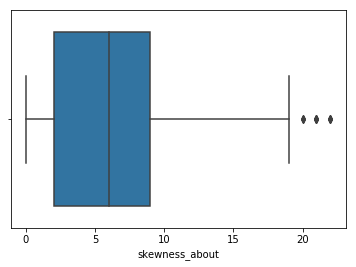

In [25]:
sns.boxplot(df_corgi['skewness_about'])
plt.show()

The above box plot shows that the column skewness about has outliers.

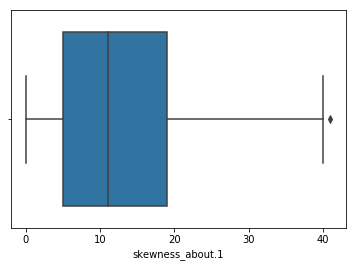

In [26]:
sns.boxplot(df_corgi['skewness_about.1'])
plt.show()

The above box plot shows that the column skewness about 1 has outliers.

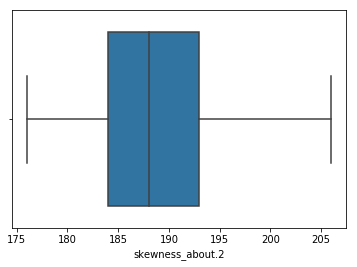

In [27]:
sns.boxplot(df_corgi['skewness_about.2'])
plt.show()

The above box plot shows that the column skewness about 2 does not have any outliers.

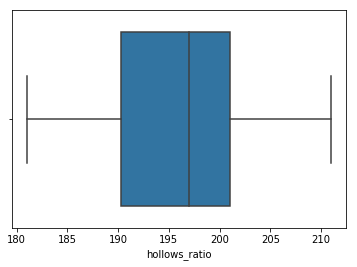

In [28]:
sns.boxplot(df_corgi['hollows_ratio'])
plt.show()

The above box plot shows that the column hollows ratio does not have any outliers.

#Handling Outliers with IQR

In [29]:
for i in df_corgi.drop(columns=['class']):
    print("Column: ", i)
    q1 = df_corgi[i].quantile(0.25)
    q3 = df_corgi[i].quantile(0.75)
    iqr = q3-q1
    ll = q1 - (1.5 * iqr)
    ul = q3 + (1.5 * iqr)
    print("IQR: ",iqr)
    print("Lower Bound",ll)
    print("Upper Bound",ul)
    print("List of outliers before replacement",list(df_corgi[i][(df_corgi[i] <= ll) | (df_corgi[i] >= ul)]))
    print("Index of the outliers: ",list(df_corgi[i][(df_corgi[i] <= ll) | (df_corgi[i] >= ul)].index))
    if len(list(df_corgi[i][(df_corgi[i] <= ll) | (df_corgi[i] >= ul)].index)) > 0:
        df_corgi[i] [list(df_corgi[i][(df_corgi[i] <= ll) | (df_corgi[i] >= ul)].index)] = df_corgi[i].median() 
    print("\n")

Column:  compactness
IQR:  13.0
Lower Bound 67.5
Upper Bound 119.5
List of outliers before replacement []
Index of the outliers:  []


Column:  circularity
IQR:  9.0
Lower Bound 26.5
Upper Bound 62.5
List of outliers before replacement []
Index of the outliers:  []


Column:  distance_circularity
IQR:  28.0
Lower Bound 28.0
Upper Bound 140.0
List of outliers before replacement []
Index of the outliers:  []


Column:  radius_ratio
IQR:  54.0
Lower Bound 60.0
Upper Bound 276.0
List of outliers before replacement [306.0, 322.0, 333.0]
Index of the outliers:  [37, 135, 388]


Column:  pr.axis_aspect_ratio
IQR:  8.0
Lower Bound 45.0
Upper Bound 77.0
List of outliers before replacement [103.0, 126.0, 126.0, 133.0, 102.0, 138.0, 97.0, 105.0]
Index of the outliers:  [4, 37, 100, 135, 291, 388, 523, 706]


C:\Users\ADMIN\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  




Column:  max.length_aspect_ratio
IQR:  3.0
Lower Bound 2.5
Upper Bound 14.5
List of outliers before replacement [52, 49, 52, 22, 48, 43, 49, 25, 46, 19, 2, 55, 22]
Index of the outliers:  [4, 37, 100, 127, 135, 291, 388, 391, 523, 544, 655, 706, 815]


Column:  scatter_ratio
IQR:  51.0
Lower Bound 70.5
Upper Bound 274.5
List of outliers before replacement []
Index of the outliers:  []


Column:  elongatedness
IQR:  13.0
Lower Bound 13.5
Upper Bound 65.5
List of outliers before replacement []
Index of the outliers:  []


Column:  pr.axis_rectangularity
IQR:  4.0
Lower Bound 13.0
Upper Bound 29.0
List of outliers before replacement [29.0]
Index of the outliers:  [835]


Column:  max.length_rectangularity
IQR:  22.0
Lower Bound 104.0
Upper Bound 192.0
List of outliers before replacement []
Index of the outliers:  []


Column:  scaled_variance
IQR:  50.0
Lower Bound 92.0
Upper Bound 292.0
List of outliers before replacement [320.0]
Index of the outliers:  [388]


Column:  scaled_variance

#Categorical Values in the dependent Column

In [30]:
df_corgi['class'].value_counts()

car    429
bus    218
van    199
Name: class, dtype: int64

#Data Description and Correlation after handling null vlaues and outliers

In [31]:
df_corgi.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.00,119.0
circularity,846.0,44.823877,6.134272,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.100473,15.741569,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.330969,32.147908,104.0,141.00,167.0,194.75,252.0
pr.axis_aspect_ratio,846.0,61.154846,5.613458,47.0,57.00,61.0,65.00,76.0
max.length_aspect_ratio,846.0,8.118203,2.064114,3.0,7.00,8.0,10.00,13.0
scatter_ratio,846.0,168.887707,33.197710,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.936170,7.811882,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.569740,2.572358,17.0,19.00,20.0,23.00,28.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.00,188.0


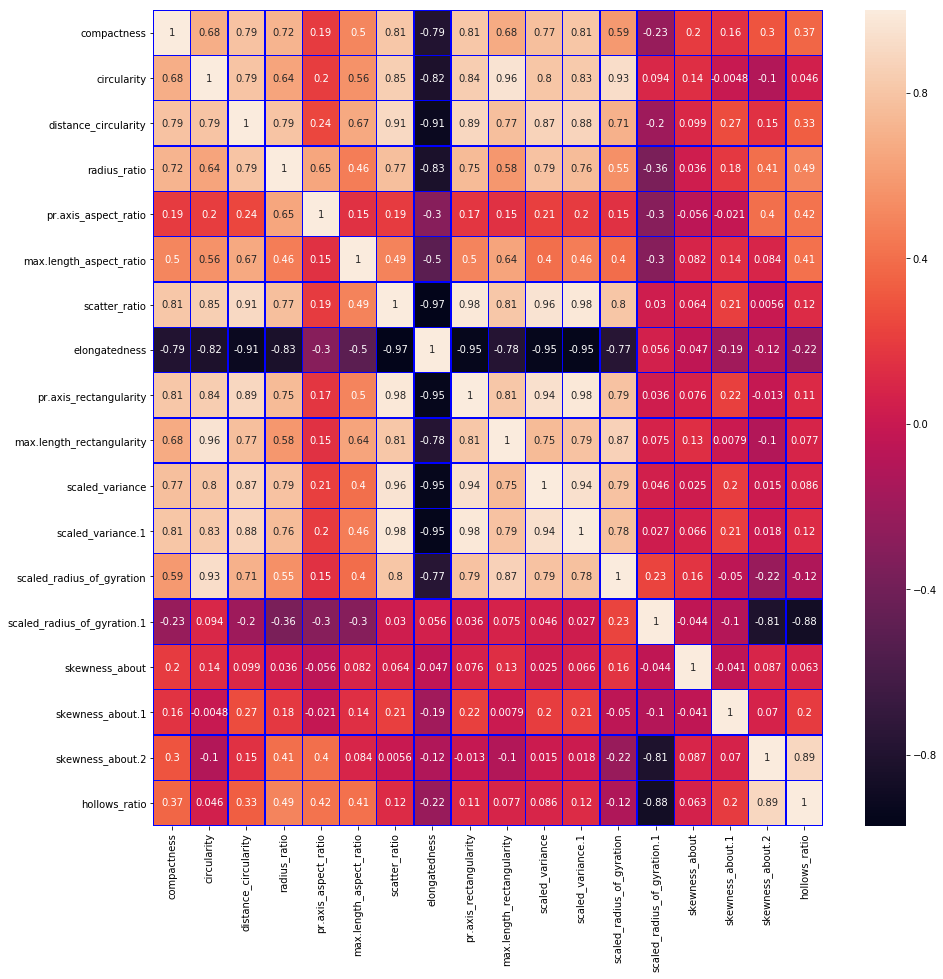

In [32]:
fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(df_corgi.corr(method='pearson'),annot=True,ax=ax,linewidths=0.5,linecolor='blue')
plt.show()

#Converting the Categorical dependent columns

In [33]:
df_corgi['class'].value_counts()

car    429
bus    218
van    199
Name: class, dtype: int64

In [34]:
replace_vals = {'class' : {'car':0,'bus':1,'van':2}}

In [35]:
df_corgi = df_corgi.replace(replace_vals)

In [36]:
df_corgi['class'] = df_corgi['class'].astype('category')

In [37]:
df_corgi.dtypes

compactness                       int64
circularity                     float64
distance_circularity            float64
radius_ratio                    float64
pr.axis_aspect_ratio            float64
max.length_aspect_ratio         float64
scatter_ratio                   float64
elongatedness                   float64
pr.axis_rectangularity          float64
max.length_rectangularity         int64
scaled_variance                 float64
scaled_variance.1               float64
scaled_radius_of_gyration       float64
scaled_radius_of_gyration.1     float64
skewness_about                  float64
skewness_about.1                float64
skewness_about.2                float64
hollows_ratio                     int64
class                          category
dtype: object

In [38]:
df_corgi.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10.0,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,2
1,91,41.0,84.0,141.0,57.0,9.0,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,2
2,104,50.0,106.0,209.0,66.0,10.0,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,0
3,93,41.0,82.0,159.0,63.0,9.0,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,2
4,85,44.0,70.0,205.0,61.0,8.0,149.0,45.0,19.0,144,241.0,325.0,188.0,71.5,9.0,11.0,180.0,183,1


#Univariate Analysis

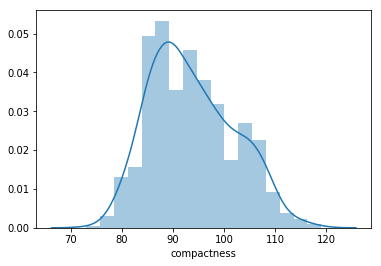

In [40]:
sns.distplot(df_corgi['compactness'])
plt.show()

The above plot is the distribution of the attribute "compactness". It shows the distribution is slightly right skewed.

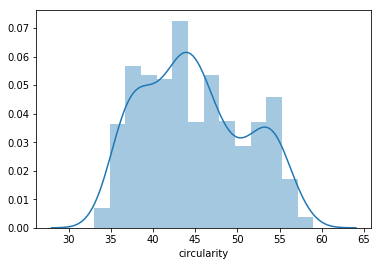

In [41]:
sns.distplot(df_corgi['circularity'])
plt.show()

The above plot shows the distribution of the attribute "Circularity".

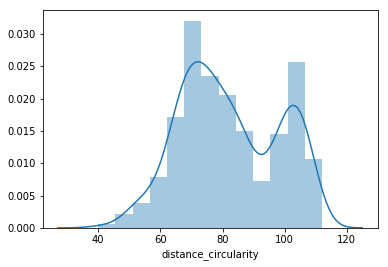

In [42]:
sns.distplot(df_corgi['distance_circularity'])
plt.show()

The above plot shows there are two Gaussians in the distance circularity distribution.

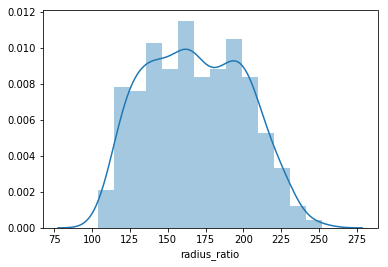

In [43]:
sns.distplot(df_corgi['radius_ratio'])
plt.show()

The above plot shows the distribution of the column radius ratio

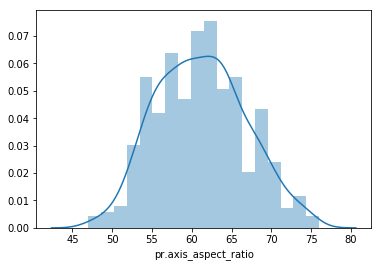

In [44]:
sns.distplot(df_corgi['pr.axis_aspect_ratio'])
plt.show()

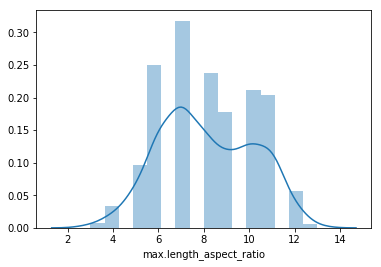

In [45]:
sns.distplot(df_corgi['max.length_aspect_ratio'])
plt.show()

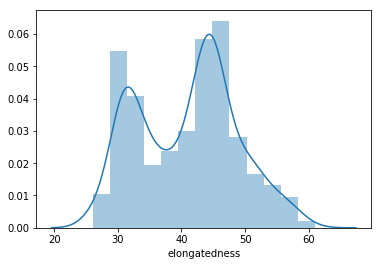

In [46]:
sns.distplot(df_corgi['elongatedness'])
plt.show()

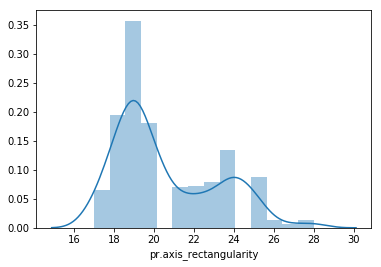

In [47]:
sns.distplot(df_corgi['pr.axis_rectangularity'])
plt.show()

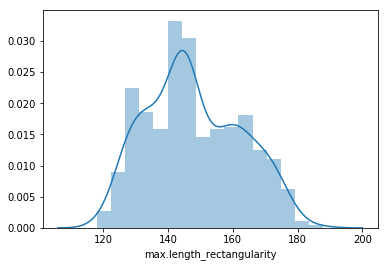

In [48]:
sns.distplot(df_corgi['max.length_rectangularity'])
plt.show()

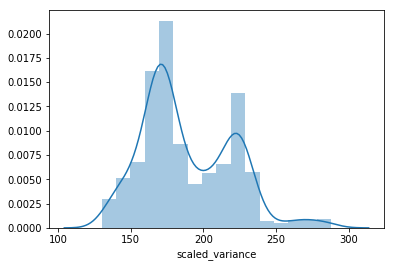

In [49]:
sns.distplot(df_corgi['scaled_variance'])
plt.show()

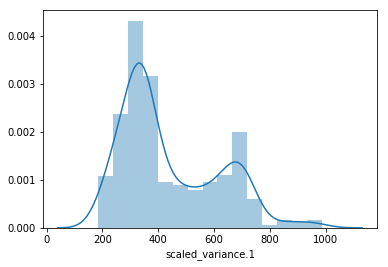

In [50]:
sns.distplot(df_corgi['scaled_variance.1'])
plt.show()

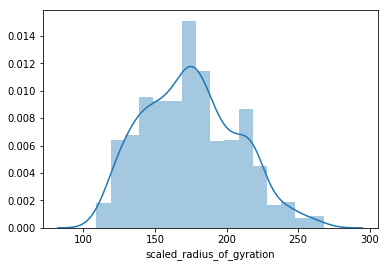

In [51]:
sns.distplot(df_corgi['scaled_radius_of_gyration'])
plt.show()

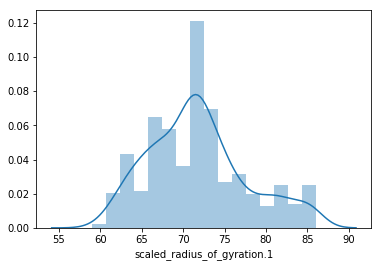

In [52]:
sns.distplot(df_corgi['scaled_radius_of_gyration.1'])
plt.show()

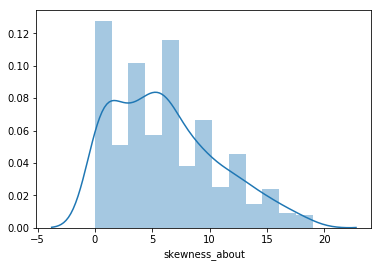

In [53]:
sns.distplot(df_corgi['skewness_about'])
plt.show()

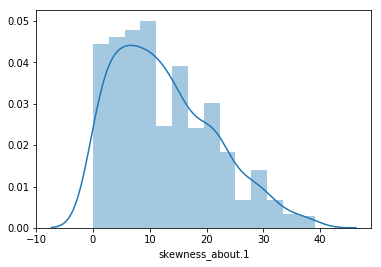

In [54]:
sns.distplot(df_corgi['skewness_about.1'])
plt.show()

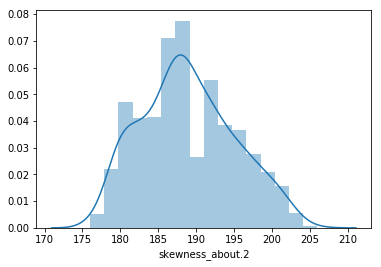

In [55]:
sns.distplot(df_corgi['skewness_about.2'])
plt.show()

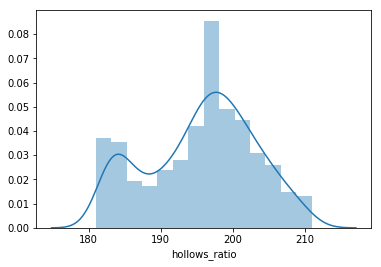

In [56]:
sns.distplot(df_corgi['hollows_ratio'])
plt.show()

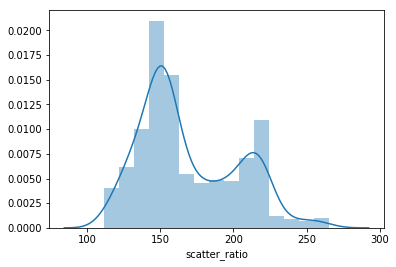

In [57]:
sns.distplot(df_corgi['scatter_ratio'])
plt.show()

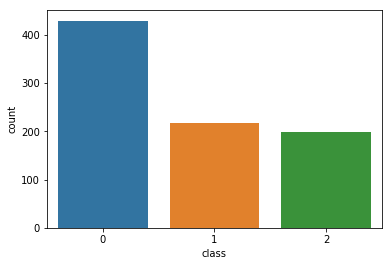

In [60]:
sns.countplot(x = 'class',data = df_corgi )
plt.show()

# Bivariate Analysis

Distribution of the classes in Compactness


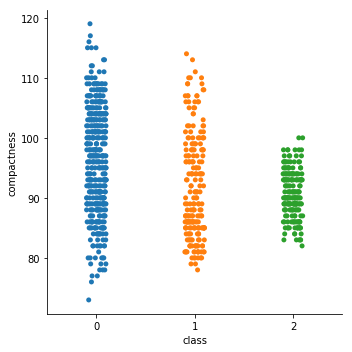

In [166]:
print("Distribution of the classes in Compactness")
sns.catplot(x = 'class',y='compactness',data=df_corgi)
plt.show()

Distribution of the classes in circularity


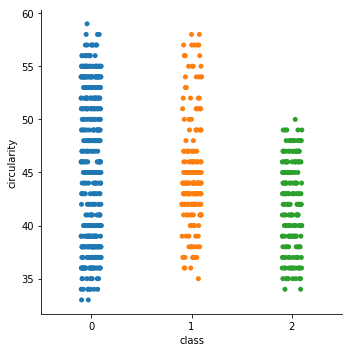

In [170]:
print("Distribution of the classes in circularity")
sns.catplot(x = 'class',y='circularity',data=df_corgi)
plt.show()

Distribution of the classes in distance_circularity


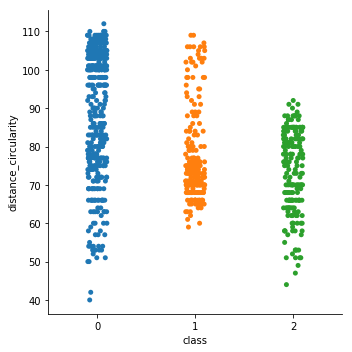

In [171]:
print("Distribution of the classes in distance_circularity")
sns.catplot(x = 'class',y='distance_circularity',data=df_corgi)
plt.show()

Distribution of the classes in radius_ratio


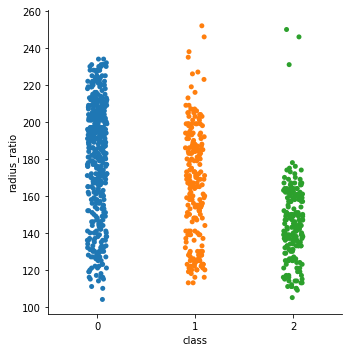

In [172]:
print("Distribution of the classes in radius_ratio")
sns.catplot(x = 'class',y='radius_ratio',data=df_corgi)
plt.show()

Distribution of the classes in pr.axis_aspect_ratio


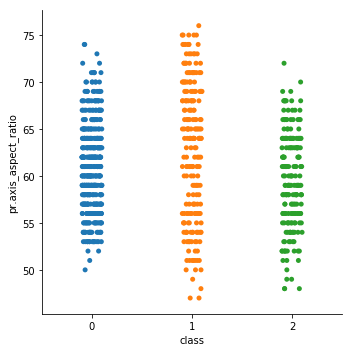

In [173]:
print("Distribution of the classes in pr.axis_aspect_ratio")
sns.catplot(x = 'class',y='pr.axis_aspect_ratio',data=df_corgi)
plt.show()

Distribution of the classes in max.length_aspect_ratio


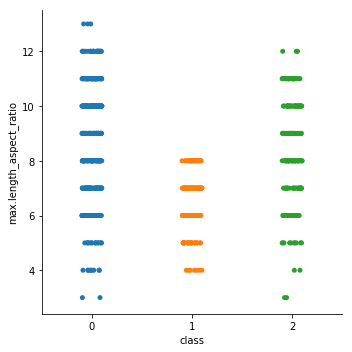

In [174]:
print("Distribution of the classes in max.length_aspect_ratio")
sns.catplot(x = 'class',y='max.length_aspect_ratio',data=df_corgi)
plt.show()

Distribution of the classes in scatter_ratio


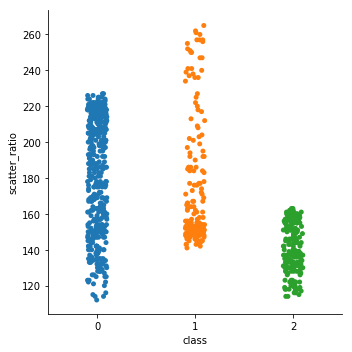

In [175]:
print("Distribution of the classes in scatter_ratio")
sns.catplot(x = 'class',y='scatter_ratio',data=df_corgi)
plt.show()

Distribution of the classes in Compactness


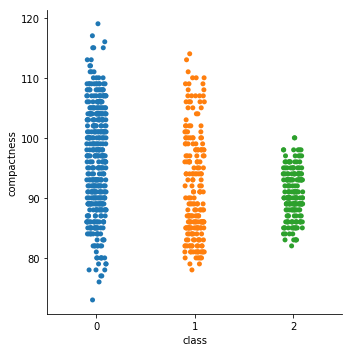

In [176]:
print("Distribution of the classes in Compactness")
sns.catplot(x = 'class',y='compactness',data=df_corgi)
plt.show()

Distribution of the classes in elongatedness


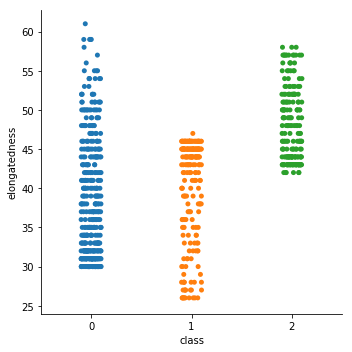

In [177]:
print("Distribution of the classes in elongatedness")
sns.catplot(x = 'class',y='elongatedness',data=df_corgi)
plt.show()

Distribution of the classes in pr.axis_rectangularity


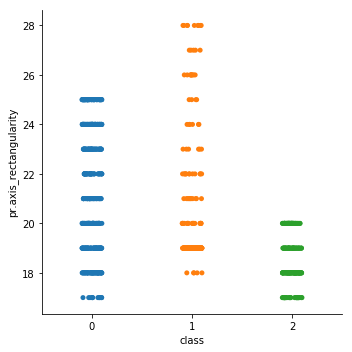

In [178]:
print("Distribution of the classes in pr.axis_rectangularity")
sns.catplot(x = 'class',y='pr.axis_rectangularity',data=df_corgi)
plt.show()

Distribution of the classes in max.length_rectangularity


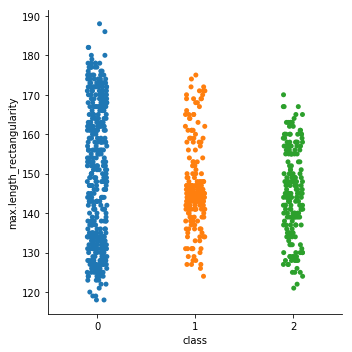

In [179]:
print("Distribution of the classes in max.length_rectangularity")
sns.catplot(x = 'class',y='max.length_rectangularity',data=df_corgi)
plt.show()

Distribution of the classes in scaled_variance


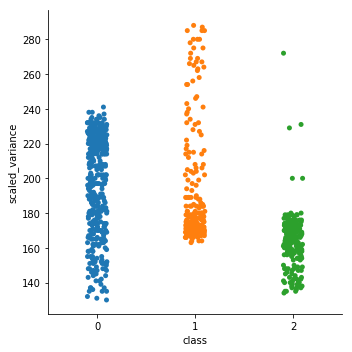

In [180]:
print("Distribution of the classes in scaled_variance")
sns.catplot(x = 'class',y='scaled_variance',data=df_corgi)
plt.show()

Distribution of the classes in scaled_variance.1


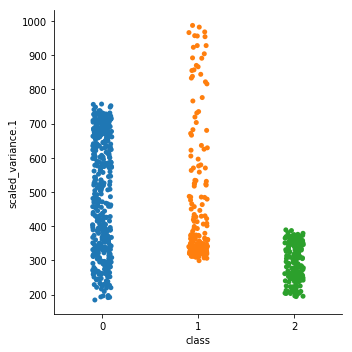

In [181]:
print("Distribution of the classes in scaled_variance.1")
sns.catplot(x = 'class',y='scaled_variance.1',data=df_corgi)
plt.show()

Distribution of the classes in scaled_radius_of_gyration


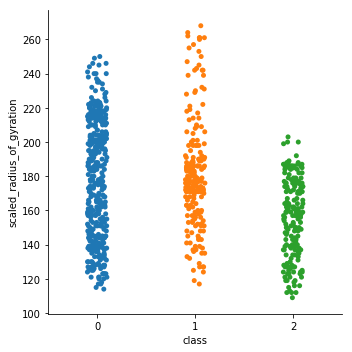

In [182]:
print("Distribution of the classes in scaled_radius_of_gyration")
sns.catplot(x = 'class',y='scaled_radius_of_gyration',data=df_corgi)
plt.show()

Distribution of the classes in skewness_about


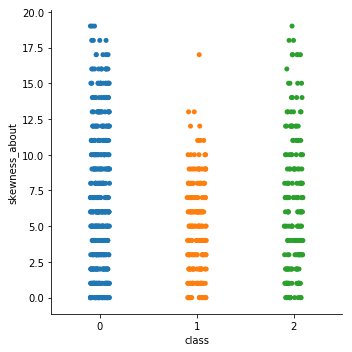

In [183]:
print("Distribution of the classes in skewness_about")
sns.catplot(x = 'class',y='skewness_about',data=df_corgi)
plt.show()

Distribution of the classes in skewness_about.1


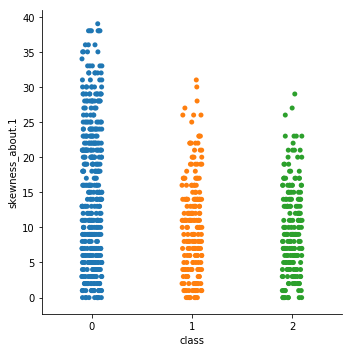

In [184]:
print("Distribution of the classes in skewness_about.1")
sns.catplot(x = 'class',y='skewness_about.1',data=df_corgi)
plt.show()

Distribution of the classes in skewness_about.2


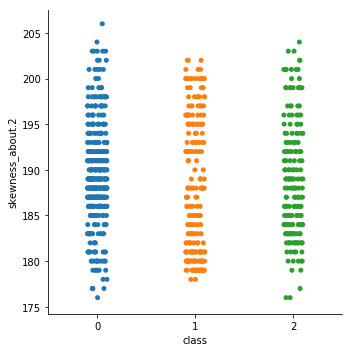

In [185]:
print("Distribution of the classes in skewness_about.2")
sns.catplot(x = 'class',y='skewness_about.2',data=df_corgi)
plt.show()

Distribution of the classes in hollows_ratio


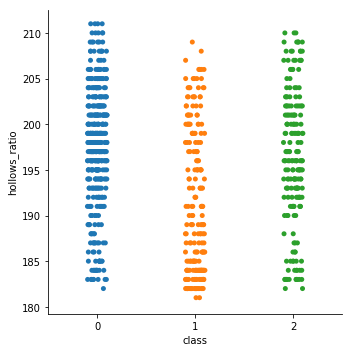

In [186]:
print("Distribution of the classes in hollows_ratio")
sns.catplot(x = 'class',y='hollows_ratio',data=df_corgi)
plt.show()

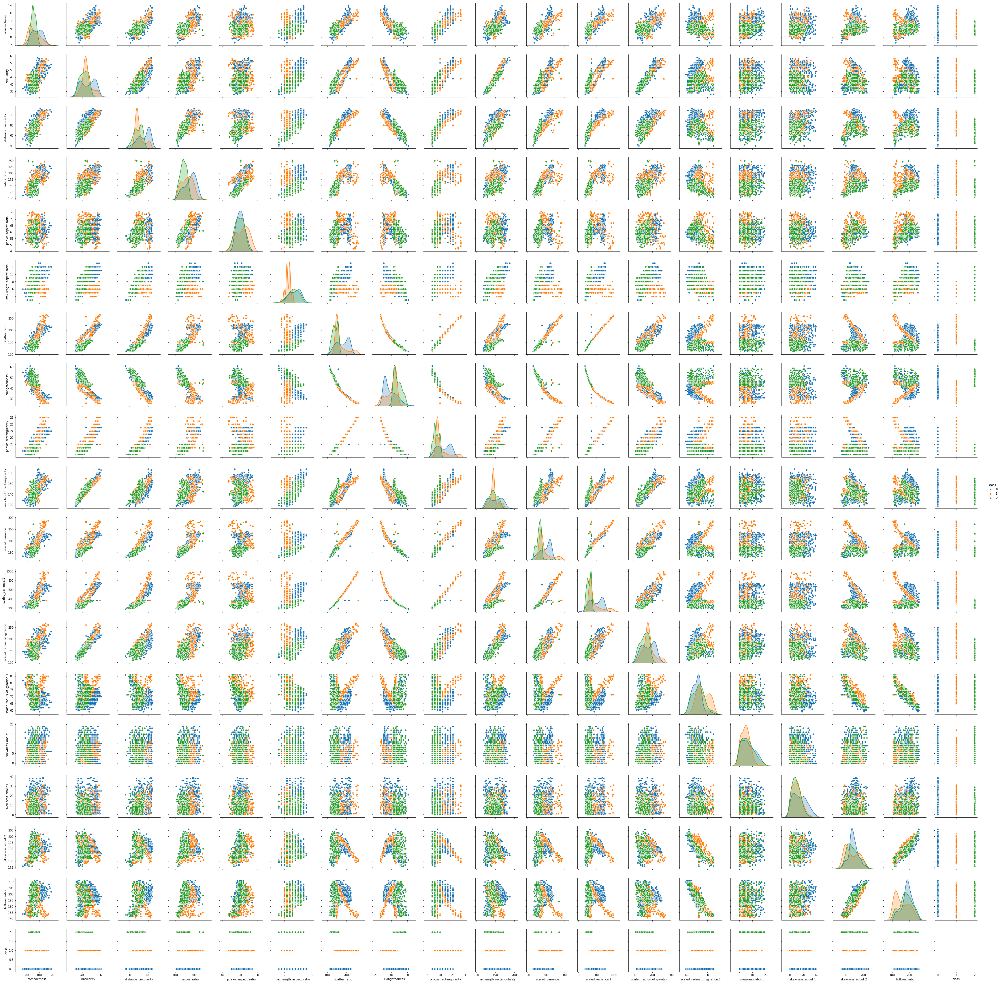

In [216]:
sns.pairplot(df_corgi,diag_kind= 'kde',hue='class')
plt.show()

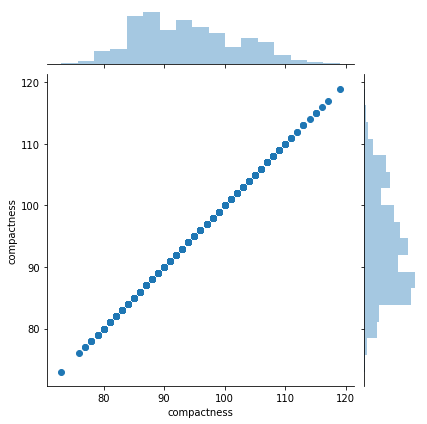

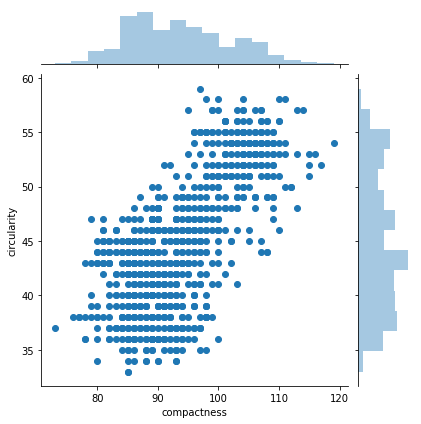

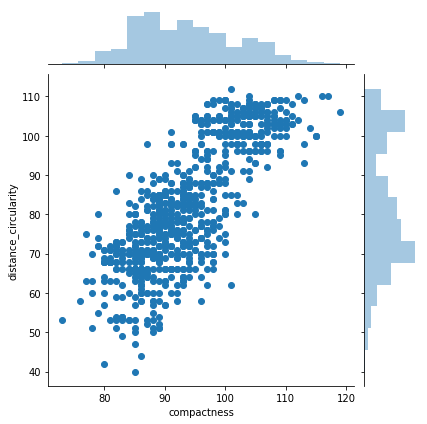

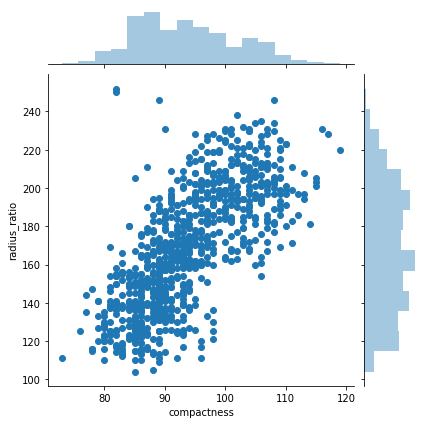

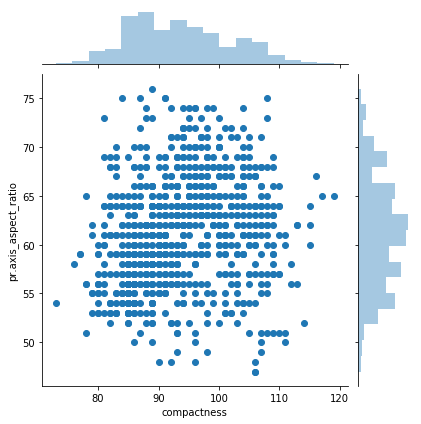

...

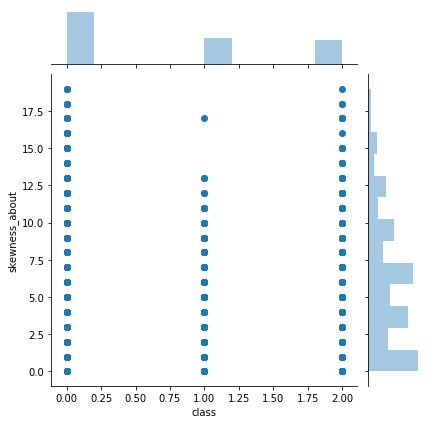

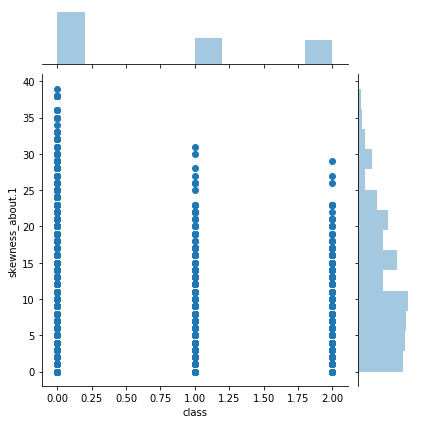

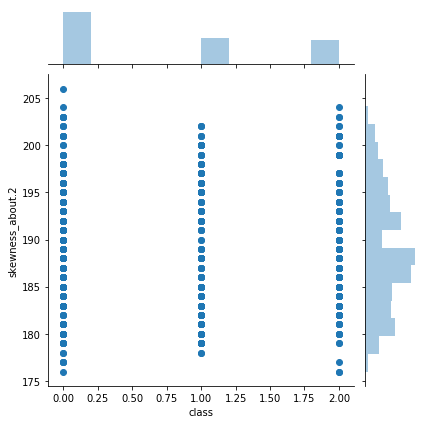

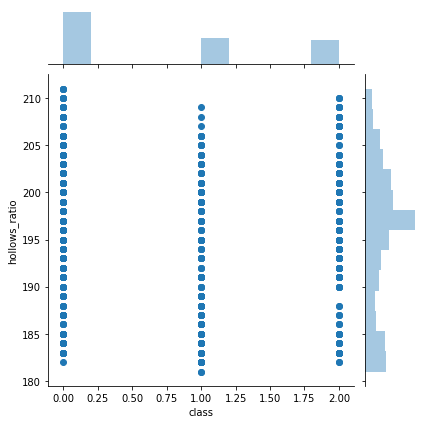

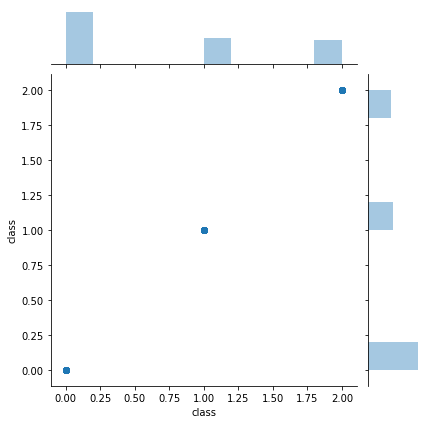

In [62]:
for i in df_corgi:
    for j in df_corgi:
        sns.jointplot(x = i, y= j,data = df_corgi)
        plt.show()

The above plots(joint and pair) shows that one or more attributes are positively or negatively correlated with one another 
hence we can opt PCA to reduce the dimensions 

#Copying the dataframe to preserve the source

In [65]:
df_copy = df_corgi
df_corgi_copy = df_copy.copy()

In [69]:
x = df_corgi_copy.drop(columns='class')
y = df_corgi_copy['class']

# Applying PCA

In [71]:
from scipy.stats import zscore
from sklearn.decomposition import PCA

In [72]:
x_scaled = x.apply(zscore)

In [78]:
np.cov(x_scaled,rowvar=False)

array([[ 1.00118343,  0.68569786,  0.79086299,  0.72277977,  0.1930925 ,
         0.50051942,  0.81358214, -0.78968322,  0.81106712,  0.67694334,
         0.77078163,  0.80712401,  0.58593517, -0.22620639,  0.19754181,
         0.15679845,  0.29889034,  0.36598446],
       [ 0.68569786,  1.00118343,  0.79325751,  0.63903532,  0.20349327,
         0.5611334 ,  0.8489411 , -0.82244387,  0.84081174,  0.96245572,
         0.80371846,  0.82844154,  0.92691166,  0.09402617,  0.13651201,
        -0.00476834, -0.10455005,  0.04640562],
       [ 0.79086299,  0.79325751,  1.00118343,  0.79516215,  0.24462154,
         0.66759792,  0.90614687, -0.9123854 ,  0.89368235,  0.77544391,
         0.87061349,  0.88498924,  0.70660663, -0.20113256,  0.09922417,
         0.2668948 ,  0.14627113,  0.33312625],
       [ 0.72277977,  0.63903532,  0.79516215,  1.00118343,  0.65132393,
         0.46450748,  0.77085211, -0.82636872,  0.74782054,  0.58015378,
         0.78711387,  0.76115704,  0.55142559, -0.361

In [82]:
pca = PCA(n_components=18)
pca.fit(x_scaled)

PCA(copy=True, iterated_power='auto', n_components=18, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

Eigen Values

In [83]:
print(pca.explained_variance_)

[9.74325762e+00 3.31751455e+00 1.19096207e+00 1.13170774e+00
 8.83813899e-01 6.73374201e-01 3.19728326e-01 2.34062999e-01
 1.45893823e-01 9.10270872e-02 7.45122994e-02 6.65783139e-02
 4.19497607e-02 3.23805657e-02 2.94665239e-02 2.03193884e-02
 1.64252898e-02 8.32732544e-03]


Eigen Vectors

In [84]:
print(pca.components_)

[[ 2.72311161e-01  2.87467607e-01  3.02408768e-01  2.69528927e-01
   9.77323883e-02  1.95161050e-01  3.10640442e-01 -3.09115385e-01
   3.07424706e-01  2.78388032e-01  2.99840760e-01  3.06078134e-01
   2.63582083e-01 -3.27575093e-02  3.60829790e-02  5.96134429e-02
   3.71308980e-02  8.39146819e-02]
 [-8.96411676e-02  1.31867800e-01 -4.72294783e-02 -2.00233343e-01
  -2.58333337e-01 -1.06513373e-01  7.32964660e-02 -1.12147274e-02
   8.06301739e-02  1.22058627e-01  7.55809350e-02  6.96491096e-02
   2.10275023e-01  5.00130044e-01 -1.38089583e-02 -8.72970326e-02
  -5.04271171e-01 -5.10159237e-01]
 [-4.20342162e-02 -2.00052144e-01  6.38628909e-02  5.85099796e-02
  -5.39346209e-02 -1.49786266e-01  1.07310216e-01 -9.01099996e-02
   1.04032932e-01 -2.13819536e-01  1.43303317e-01  1.09901523e-01
  -2.01751461e-01  7.42422315e-02 -5.61356679e-01  6.70367837e-01
  -6.29779144e-02 -4.33387461e-02]
 [ 1.40161108e-01 -4.11271674e-02  1.10550713e-01 -2.52815849e-01
  -6.13797589e-01  2.74885015e-01  6.

Percentage of variation 

In [106]:
summ = 0
for i in list(pca.explained_variance_ratio_):
    print(i)   
    summ = summ + i
    if summ > 0.95 and summ < 0.96:
        print("sum of Variance",summ)

0.5406522647227167
0.1840885075793325
0.06608635057387209
0.06279833464705832
0.04904273342345424
0.03736545834664797
0.017741688701174825
sum of Variance 0.9577753379942566
0.012988129374734904
0.00809563176115924
0.005051082787090389
0.004134679075641792
0.003694423119470398
0.0023277874850229606
0.0017967939314277046
0.0016350940819320542
0.0011275205662290345
0.000911437474858857
0.0004620823481760452


Important features are plotted in this graph


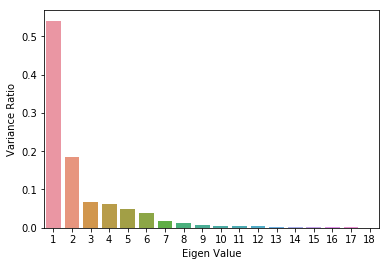

In [91]:
print("Important features are plotted in this graph")
columns = list(range(1,19))
Explained_Variance_Ratio = pca.explained_variance_ratio_
sns.barplot(x =columns ,y=Explained_Variance_Ratio)
plt.xlabel('Eigen Value')
plt.ylabel('Variance Ratio')
plt.show()

From the above grapg it is evident that first seven features is enough for explaing more than 95% of the vairance in the data, 
this seven features explains 95.77 percentage of variance in the data. 

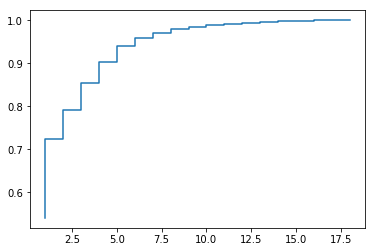

In [107]:
plt.step(list(range(1,19)),np.cumsum(pca.explained_variance_ratio_))
plt.show()

From the elbow plot we can infer that that first seven features is enough for explaing more than 95% of the vairance in the data, 
this seven features explains 95.77 percentage of variance in the data. The curve gradually straightens after 7.5.

# Reduced Dimensions

In [110]:
pca7 = PCA(n_components=7)
pca7.fit(x_scaled)

PCA(copy=True, iterated_power='auto', n_components=7, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [112]:
print("Components: ",pca7.components_)
print("\n")
print("Explained Variance: ",pca7.explained_variance_)
print("\n")
print("Explained Variance Ratio: ",pca7.explained_variance_ratio_)

Components:  [[ 2.72311161e-01  2.87467607e-01  3.02408768e-01  2.69528927e-01
   9.77323883e-02  1.95161050e-01  3.10640442e-01 -3.09115385e-01
   3.07424706e-01  2.78388032e-01  2.99840760e-01  3.06078134e-01
   2.63582083e-01 -3.27575093e-02  3.60829790e-02  5.96134429e-02
   3.71308980e-02  8.39146819e-02]
 [-8.96411676e-02  1.31867800e-01 -4.72294783e-02 -2.00233343e-01
  -2.58333337e-01 -1.06513373e-01  7.32964660e-02 -1.12147274e-02
   8.06301739e-02  1.22058627e-01  7.55809350e-02  6.96491096e-02
   2.10275023e-01  5.00130044e-01 -1.38089583e-02 -8.72970326e-02
  -5.04271171e-01 -5.10159237e-01]
 [-4.20342162e-02 -2.00052144e-01  6.38628909e-02  5.85099796e-02
  -5.39346209e-02 -1.49786266e-01  1.07310216e-01 -9.01099996e-02
   1.04032932e-01 -2.13819536e-01  1.43303317e-01  1.09901523e-01
  -2.01751461e-01  7.42422315e-02 -5.61356679e-01  6.70367837e-01
  -6.29779144e-02 -4.33387461e-02]
 [ 1.40161108e-01 -4.11271674e-02  1.10550713e-01 -2.52815849e-01
  -6.13797589e-01  2.748

In [113]:
x_pca7 = pca7.fit_transform(x_scaled)

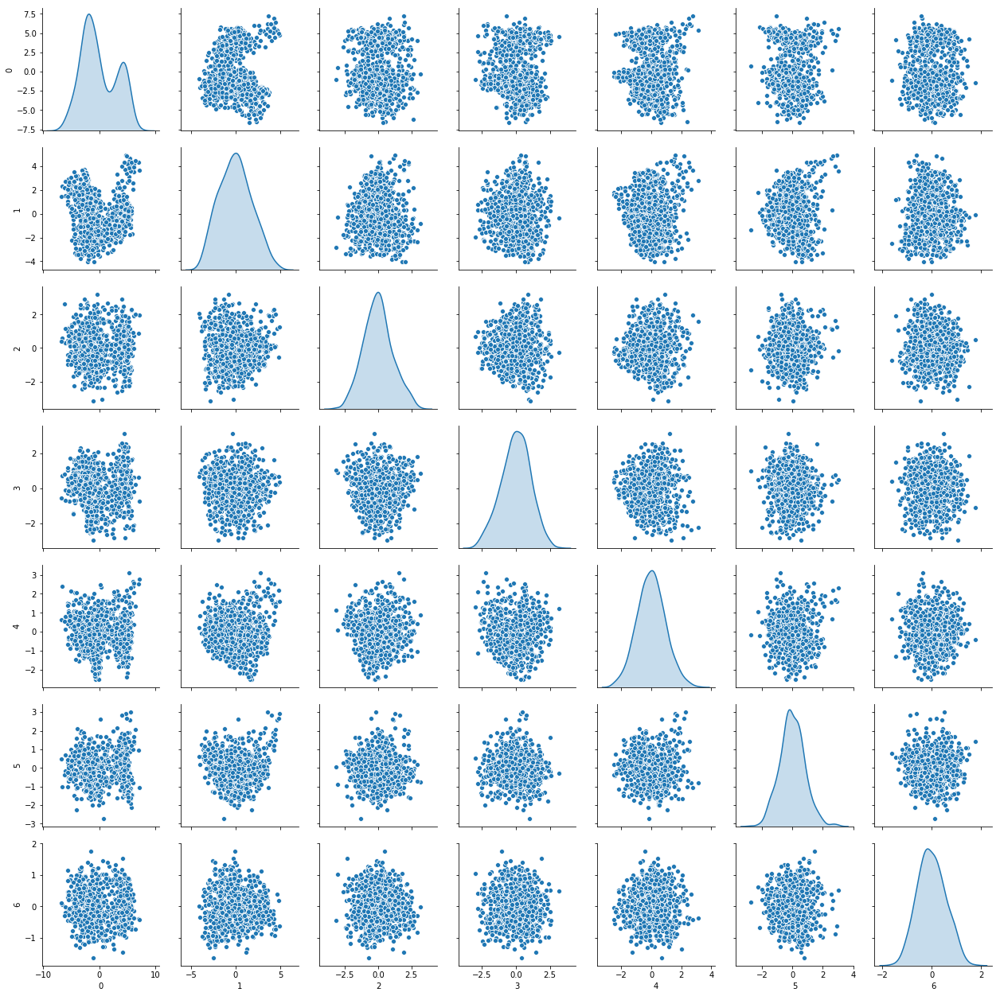

In [117]:
sns.pairplot(pd.DataFrame(x_pca7),diag_kind='kde')
plt.show()

The above pair plot clearly explains that all the idependent attributes are independent 
of one another after dimensionality reduction using PCA.

In [121]:
from sklearn.model_selection import train_test_split

In [122]:
x_train_pca7,x_test_pca7,y_train,y_test = train_test_split(pd.DataFrame(x_pca7),y,test_size = 0.30,random_state = 1)

In [123]:
from sklearn import svm
clf_pca7 = svm.SVC(gamma=0.025,C=3)

In [124]:
clf_pca7.fit(x_train_pca7,y_train)

SVC(C=3, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=0.025, kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [126]:
predicted_pca7 = clf_pca7.predict(x_test_pca7)

In [127]:
clf_pca7.score(x_test_pca7,y_test)

0.9212598425196851

We have the model score of 92% after the dimensions are reduced

In [142]:
from sklearn.metrics import confusion_matrix 

In [150]:
cm_pca7 = confusion_matrix(y_test,predicted_pca7)

In [151]:
cm_pca7

array([[127,   1,   5],
       [  4,  53,   2],
       [  6,   2,  54]], dtype=int64)

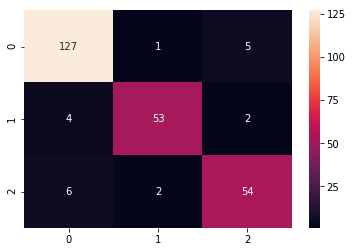

In [162]:
sns.heatmap(cm_pca7,annot=True,fmt='g')
plt.show()

In [132]:
x_train,x_test,y_train_np,y_test_np = train_test_split(x_scaled,y,test_size = 0.30,random_state = 1)

In [133]:
clf_svm = svm.SVC(gamma=0.025,C=3)

In [138]:
clf_svm.fit(x_train,y_train_np)

SVC(C=3, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=0.025, kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [140]:
predicted_np_pca = clf_svm.predict(x_test)

In [141]:
clf_svm.score(x_test,y_test_np)

0.9606299212598425

If the dimensions are not reduced then we get a model score of 96.1%

In [157]:
cm_nopca = confusion_matrix(y_test_np,predicted_np_pca)
cm_nopca

array([[129,   1,   3],
       [  1,  58,   0],
       [  4,   1,  57]], dtype=int64)

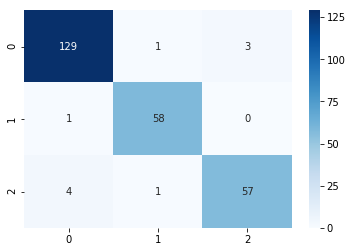

In [161]:
sns.heatmap(cm_nopca,annot=True,fmt='g',cmap='Blues')
plt.show()

Conslusion: From the above scores we can conclusde that there is 4% loss in the model if we reduce the dimensions using PCA. 
Whereas on the other hand with just 7 dimensions we were able to achieve 92% as our model score. This shows that 95% of the 
vairance is described by just the 7 dimensions in the dataset. 

# Grid Search to set the best Hyperparameters

Note: All the attributes are considered for obvious reasons

In [210]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
import warnings; warnings.simplefilter('ignore')

In [211]:
hyper_parameters = [{'kernel':['rbf'],'gamma':[0.025],'C':[0.01, 0.05, 0.5, 1]},
                   {'kernel':['linear'],'gamma':[0.025],'C':[0.01, 0.05, 0.5, 1]}]
scores_hp = ['precision', 'recall']
#svc = svm.SVC()
for i in scores_hp:
    clf_hp = GridSearchCV(SVC(),hyper_parameters,scoring='%s_macro' % i)
    clf_hp.fit(x_train,y_train_np)
    #print("\n")
    print("The best parameters are: \n ",clf_hp.best_params_)
    print("\n")
    print(clf_hp.score(x_test,y_test_np))

The best parameters are: 
  {'C': 1, 'gamma': 0.025, 'kernel': 'rbf'}


0.9516635279347144
The best parameters are: 
  {'C': 1, 'gamma': 0.025, 'kernel': 'rbf'}


0.9464174377989808


From the above model it can be observed that the best C value is 1.

In [212]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [215]:
num_folds = 50
model = SVC()
seed =7
k_fold = KFold(n_splits=50,random_state=seed)
results = cross_val_score(model,x_scaled,y,cv=k_fold)
print(results)
print("Model score in Production will be: ",results.mean()*100)
print("The standrad deviation will be: ",results.std()*100)

[0.94117647 0.82352941 1.         0.94117647 0.94117647 0.94117647
 0.94117647 0.94117647 1.         1.         1.         1.
 0.94117647 0.88235294 1.         1.         0.94117647 0.94117647
 1.         1.         0.94117647 1.         0.82352941 1.
 1.         1.         0.94117647 1.         0.94117647 0.94117647
 1.         1.         0.94117647 1.         0.94117647 0.88235294
 0.88235294 1.         0.94117647 0.94117647 0.94117647 0.94117647
 1.         0.94117647 0.94117647 1.         0.875      1.
 1.         0.9375    ]
Model score in Production will be:  95.74264705882354
The standrad deviation will be:  4.590785725920442
